In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/adience-y/y_train_np.pkl
/kaggle/input/adience-y/y_test_np.pkl
/kaggle/input/celeba/celebA_after_activation.h5
/kaggle/input/celeba/celebA_after_activation.pkl
/kaggle/input/gender-recognition-200k-images-celeba/Dataset/Validation/Female/197574.jpg
/kaggle/input/gender-recognition-200k-images-celeba/Dataset/Validation/Female/191289.jpg
/kaggle/input/gender-recognition-200k-images-celeba/Dataset/Validation/Female/197046.jpg
/kaggle/input/gender-recognition-200k-images-celeba/Dataset/Validation/Female/185335.jpg
/kaggle/input/gender-recognition-200k-images-celeba/Dataset/Validation/Female/198792.jpg
/kaggle/input/gender-recognition-200k-images-celeba/Dataset/Validation/Female/199519.jpg
/kaggle/input/gender-recognition-200k-images-celeba/Dataset/Validation/Female/185168.jpg
/kaggle/input/gender-recognition-200k-images-celeba/Dataset/Validation/Female/185383.jpg
/kaggle/input/gender-recognition-200k-images-celeba/Dataset/Validation/Female/198921.jpg
/kaggle/input/gender-reco

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image

import tensorflow as tf
import tensorflow_datasets as tfds
from keras import regularizers
from keras.models import Sequential
from keras import layers
from keras.utils import np_utils
from keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img

In [ ]:
path = '/kaggle/input/gender-recognition-200k-images-celeba/Dataset'

img_height = 227
img_width = 227
train_path = path+'/Train'
train_ds = tf.keras.utils.image_dataset_from_directory(
  train_path,
  seed=123,
  image_size=(img_height, img_width),
  shuffle=True)

Found 160000 files belonging to 2 classes.


2021-11-14 05:24:07.138984: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-14 05:24:07.249655: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-14 05:24:07.250372: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-14 05:24:07.252804: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

In [ ]:
path = '/kaggle/input/gender-recognition-200k-images-celeba/Dataset'

img_height = 227
img_width = 227
test_path = path+'/Test'
test_ds = tf.keras.utils.image_dataset_from_directory(
  test_path,
  seed=123,
  image_size=(img_height, img_width),
  shuffle=True)

Found 20001 files belonging to 2 classes.


In [ ]:
train_ds = train_ds.map(lambda x, y: (x, tf.one_hot(y, depth=2)))
test_ds = test_ds.map(lambda x, y: (x, tf.one_hot(y, depth=2)))

In [ ]:
model = Sequential([
      layers.Conv2D(96, (7, 7), padding='valid',activation = 'relu', 
                    input_shape=(227, 227, 3)),
      layers.BatchNormalization(),
      layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid'),

      layers.Conv2D(256, (5, 5), padding='valid', activation='relu'),
      layers.BatchNormalization(),
      layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid'),

      layers.Conv2D(384, (3, 3), padding='valid', activation='relu'),
      layers.BatchNormalization(),
      layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='valid'),

      layers.Flatten(),
      layers.Dense(512, activation='relu'),
      layers.Dropout(0.25),
      layers.Dense(512, activation='relu'),
      layers.Dropout(0.25),
      layers.Dense(2, activation='softmax')
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 221, 221, 96)      14208     
_________________________________________________________________
batch_normalization (BatchNo (None, 221, 221, 96)      384       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 110, 110, 96)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 106, 106, 256)     614656    
_________________________________________________________________
batch_normalization_1 (Batch (None, 106, 106, 256)     1024      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 52, 52, 256)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 50, 50, 384)       8

In [ ]:
epochs=15

history = model.fit(train_ds, validation_data=test_ds, epochs=epochs, batch_size=32, verbose=2)

2021-11-14 05:24:25.275437: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/15


2021-11-14 05:24:27.664565: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


5000/5000 - 765s - loss: 0.8743 - accuracy: 0.9062 - val_loss: 0.1154 - val_accuracy: 0.9547
Epoch 2/15
5000/5000 - 710s - loss: 0.1526 - accuracy: 0.9468 - val_loss: 0.1271 - val_accuracy: 0.9646
Epoch 3/15
5000/5000 - 710s - loss: 0.1200 - accuracy: 0.9595 - val_loss: 0.1373 - val_accuracy: 0.9667
Epoch 4/15
5000/5000 - 710s - loss: 0.1077 - accuracy: 0.9637 - val_loss: 0.0815 - val_accuracy: 0.9707
Epoch 5/15
5000/5000 - 711s - loss: 0.0914 - accuracy: 0.9693 - val_loss: 0.1081 - val_accuracy: 0.9733
Epoch 6/15
5000/5000 - 711s - loss: 0.0832 - accuracy: 0.9721 - val_loss: 0.0636 - val_accuracy: 0.9775
Epoch 7/15
5000/5000 - 720s - loss: 0.0849 - accuracy: 0.9727 - val_loss: 0.0708 - val_accuracy: 0.9755
Epoch 8/15
5000/5000 - 710s - loss: 0.0756 - accuracy: 0.9747 - val_loss: 0.0631 - val_accuracy: 0.9760
Epoch 9/15
5000/5000 - 711s - loss: 0.0674 - accuracy: 0.9770 - val_loss: 0.0636 - val_accuracy: 0.9777
Epoch 10/15
5000/5000 - 711s - loss: 0.0627 - accuracy: 0.9797 - val_loss: 

In [ ]:
import pickle
model.save('celebA_after_activation.h5')
with open('celebA_after_activation.pkl','wb') as f:
  pickle.dump(history.history, f) 

In [ ]:
with open('celebA_after_activation.pkl','rb') as f:
     history_list = pickle.load(f)

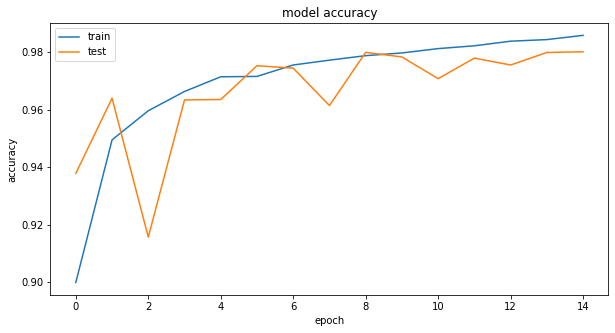

In [ ]:
# Plot accuracies of training and test data
plt.figure(figsize=(10,5))
plt.plot(history_list['accuracy'])
plt.plot(history_list['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='best')
plt.show();

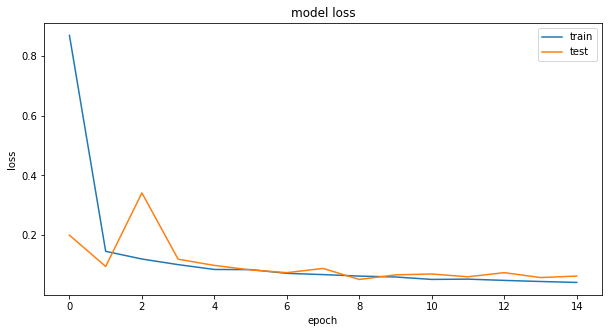

In [ ]:
# Plot losses of training and test data
plt.figure(figsize=(10,5))
plt.plot(history_list['loss'])
plt.plot(history_list['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='best')
plt.show();

Load and try the model

In [ ]:
from tensorflow import keras

import tensorflow as tf
import PIL
import PIL.Image
import numpy as np
import pickle

from keras.utils import np_utils
from keras.models import load_model


In [ ]:
model_path = '/kaggle/input/celeba/celebA_after_activation.h5'

gender_model = load_model(model_path)

Load Aidence numpy array

In [ ]:
import pickle

path = '/kaggle/input/aidence-data/'
with open(path + 'train_images_np.pkl','rb') as f:
     train_images = pickle.load(f)

with open(path + 'test_images_np.pkl','rb') as f:
     test_images = pickle.load(f)
        
        
path = '/kaggle/input/adience-y/'
with open(path + 'y_train_np.pkl','rb') as f:
     y_train_one_hot = pickle.load(f)

with open(path + 'y_test_np.pkl','rb') as f:
     y_test_one_hot = pickle.load(f)

print(train_images.shape)
print(test_images.shape)
print(y_train_one_hot.shape)
print(y_test_one_hot.shape)

(12216, 227, 227, 3)
(5236, 227, 227, 3)
(12216, 2)
(5236, 2)


Compile with low learning rate

In [ ]:
def numpy_to_tensor(numpy_input):
    tensor = tf.convert_to_tensor(numpy_input, dtype=tf.float32)
    return tf.expand_dims(tensor, axis=0)

def truth_output(softmax_output):
  if softmax_output[0] > softmax_output[1]:
      return "Female"
  else:
      return "Male"

def predicted_output(softmax_output):
  if softmax_output[0][0] > softmax_output[0][1]:
      return "Female"
  else:
      return "Male"

def try_model(index):
    display(PIL.Image.fromarray(np.uint8(train_images[index])))

    print(f"truth value: {truth_output(y_train_one_hot[index])}")
    print(f"predicted value: {predicted_output(gender_model.predict(numpy_to_tensor(train_images[index])))}")

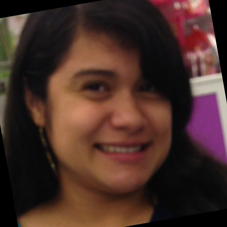

truth value: Female
predicted value: Male


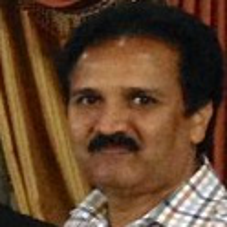

truth value: Male
predicted value: Male


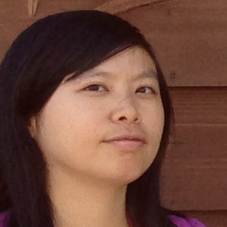

truth value: Female
predicted value: Female


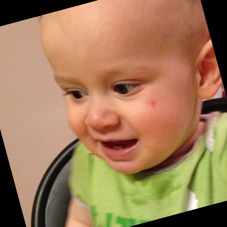

truth value: Male
predicted value: Male


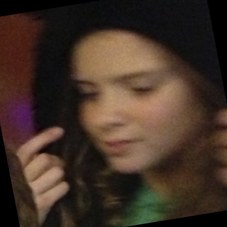

truth value: Female
predicted value: Male


In [ ]:
import random
try_images = [random.randint(0,1000) for x in range(5)]
try_images

for image in try_images:
    try_model(image)

In [ ]:
gender_model.compile(optimizer=keras.optimizers.Adam(1e-5),
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])

Fit model to new data

In [ ]:
epochs=15

history = gender_model.fit(train_images, y_train_one_hot, validation_data=(test_images, y_test_one_hot), epochs=epochs, batch_size=32, verbose=2)

2021-11-14 08:28:41.822452: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1888434792 exceeds 10% of free system memory.
2021-11-14 08:28:43.781807: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1888434792 exceeds 10% of free system memory.


Epoch 1/15
382/382 - 63s - loss: 1.7275 - accuracy: 0.6045 - val_loss: 0.9599 - val_accuracy: 0.6224
Epoch 2/15
382/382 - 57s - loss: 1.2091 - accuracy: 0.6244 - val_loss: 0.7760 - val_accuracy: 0.6329
Epoch 3/15
382/382 - 57s - loss: 0.9534 - accuracy: 0.6339 - val_loss: 0.6862 - val_accuracy: 0.6427
Epoch 4/15
382/382 - 57s - loss: 0.8120 - accuracy: 0.6406 - val_loss: 0.6435 - val_accuracy: 0.6442
Epoch 5/15
382/382 - 57s - loss: 0.7382 - accuracy: 0.6433 - val_loss: 0.6256 - val_accuracy: 0.6488
Epoch 6/15
382/382 - 57s - loss: 0.6931 - accuracy: 0.6442 - val_loss: 0.6192 - val_accuracy: 0.6516
Epoch 7/15
382/382 - 57s - loss: 0.6660 - accuracy: 0.6507 - val_loss: 0.6171 - val_accuracy: 0.6551
Epoch 8/15
382/382 - 57s - loss: 0.6493 - accuracy: 0.6515 - val_loss: 0.6128 - val_accuracy: 0.6629
Epoch 9/15
382/382 - 57s - loss: 0.6331 - accuracy: 0.6543 - val_loss: 0.6080 - val_accuracy: 0.6681
Epoch 10/15
382/382 - 57s - loss: 0.6277 - accuracy: 0.6610 - val_loss: 0.6035 - val_accura